# Breast cancer example

# Pose pipeline overview

(Single-modal) In this tutorial, we demonstrate how to perform the POSE pipeline on Breast Cancer (BC) RNA data from TCGA. This analysis entails the following:

1. Upload data
2. Compute pairwise sample (WE) distances with respect to gene neigborhoods 
3. Compute global pairwise sample (WE) distance matrices
4. Convert global distances to a single sample pairwise similarity matrix
5. (Future work - dpt distance and/or multi-scale diffusion based distances)
6. Extract pseudo-organization (i.e., ordering) of samples.
7. Determine schema (i.e., branching).
8. Visualize schema
9. (Future work - further investigation into samples within different branches and differential analysis between branches)

- $d_W(i,j,v)$ - The Wasserstein distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $d_E(i,j,v)$ - The Euclidean distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $D_W(i,j) = |d_W(i,j,v)|$ - Net Wasserstein distance between sample $i$ and sample $j$ wrt all genes $v$
- $D_E(i,j) = |d_E(i,j,v)|$ - Net Euclidean distance between sample $i$ and sample $j$ wrt all genes $v$
- $K_W = e^{-\frac{\|D_W\|^2}{\sigma^2}}$ - Pairwise sample Wasserstein similarity matrix 
- $K_E = e^{-\frac{\|D_E\|^2}{\sigma^2}}$ - Pairwise sample Euclidean similarity matrix 
- (Multi-feature, multi-modal) $K = \frac{K_W + K_E}{2}$ - Fused pairwise sample similarity matrix
- $D = 1 - K$ - Fused pairwise sample distance matrix
- (Clustering) Determine branching according to lineage tracing algorithm using $D$ 
- (Visualizing) Pseudo-ordering of samples in branches according to distance from root node $r$, i.e., $D(r,:)$

__Input__
- `X` : RNA-Seq data matrix
- `genelist` : list of genes of interest in `X`
- `G` : gene-gene (or protein-protein) interaction network

__Algorithm__
1. Compute sample-pairwise distances:
    1. Compute sample-pairwise gene-1-hop-neighborhood distances:
        - Wasserstein distances (shape): For each gene `g` in the `genelist`, compute $$d_W^{(g)}(sample_i, sample_j)$$ which is the Wasserstein distance of gene `g`'s 1-hop neighborhood between every two samples `i` and `j`.
        - Euclidean distances (scale): For each gene `g` in the `genelist`, compute $$d_E^{(g)}(sample_i, sample_j)$$ which is the Euclidean distance of gene `g`'s 1-hop neighborhood (including self) between every two samples `i` and `j`.
    2. Compute net sample-pairwise distances:
        - Wasserstein distance (shape): $$d_W(sample_i, sample_j) = |d_W^{(g)}(sample_i, sample_j)|$$ as the $L_1$ or $L_2$ norm of the vector of gene-1-hop-neighborhood Wasserstein distances for all genes `g` in the `genelist`.
        - Euclidean distance (scale): $$d_E(sample_i, sample_j) = |d_E^{(g)}(sample_i, sample_j)|$$ as the $L_1$ or $L_2$ norm of the vector of gene-1-hop-neighborhood Euclidean distances for all genes `g` in the `genelist`.
2. Convert net sample-pairwise distances to standardized similarities:
    - $\sigma$ : Kernel width representing each data point's accessible neighbors. 
    - Set $\sigma$ normalization for each obs as the distance to its k-th neighbor : $$K_{ij}(d) = \sqrt{\frac{2\sigma_i\sigma_j}{\sigma_i^2 + \sigma_j^2}}e^{-\frac{|d_{ij}^2|}{2(\sigma_i^2 + \sigma_j^2)}}$$
where for each observation $i$, $\sigma_i$ is the distance to its $k$-th nearest neighbor.
        - Standardized sample-pairwise Wasserstein similarity: $$K_W = K(d_W)$$
        - Standardized sample-pairwise Euclidean similarity: $$K_E = K(d_E)$$
3. Compute fused similarity $\tilde{K}$:
    - $\tilde{K} = \frac{K_W + K_E}{2}$ (Note : could choose other weights to fuse with an unbalanced combination)
4. Compute diffusion distance from similarity: $d_K$
5. Compute POSE from diffusion distance: $G_{POSE}$
6. PROBE the POSE:
    - Clustering
    - Visualization
<!-- 4. Compute fused sample-pairwise distance $d_F$:
    - $d_F = 1 - \frac{K_W + K_E}{2}$ (Note : could choose other weights to fuse with an unbalanced combination)
5. Compute sample-pairwise co-branch frequency from pseudo-organization:
    - Compute pseudo-organization branching using each sample as the root.
    - Count the number (or percentage) of times every two samples are found in the same branch - `tracker(sample_i, sample_j)`
6. Cluster samples and generate organization schema:
    - user specified parameters:
        - `percentage (0 < percentage <= 100)` : Percentage of pseudo-organizations that samples must be found in the same branch to be considered part of the same cluster.
        - `min_clus_component_size (1 <= min_clus_component_size <= largest number of samples within a single connected component)` : Remove each cluster where the connected component it belongs to has less than `min_island_clus_size` samples collectively.
    - approach for constructing the schema:
        - For each sample `i`, identify cluster `c_i` where $$c_i = \{ i \} \cup \{ j : tracker(i, j) >= percentage \}, $$ which is represented as a node in the schema.
        - Draw an edge between every two clusters/nodes (e.g., `c_i` and `c_j`) where there is an overlap in the samples associated with each clusters/nodes.
        - Remove connected components in the schema associated with less than `min_clus_component_size` samples, collectively.
        - (To do:) Draw fictitious edges to connect the connected-components based on inter-pseudo-organization distance

 -->


__Aknowledgement__
- The diffusion distance and pseudo-ordering is performed according to the lineage tracing algorithm presented in Haghverdi, et al. (2019). 
- The code for computing the ordering is largely adopted from the scanpy implementation in Python.


First, import the necessary packages:

# Load libraries

In [1]:
import pathlib
import sys

from collections import defaultdict as ddict
import itertools
import matplotlib.colors as cm
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import scipy.sparse as sc_sparse
from tqdm import tqdm

If ``netflow`` has not been installed, add the path to the library:

In [2]:
sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[3].resolve().as_posix())
# sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[0].resolve().as_posix())

In [3]:
import netflow as nf
from netflow.probe import visualization as nfv

# Set up directories

In [4]:
MAIN_DIR = pathlib.Path('.').absolute()

Paths to where data is stored:

In [5]:
DATA_DIR = MAIN_DIR / 'example_data' / 'breast_tcga'

RNA_FNAME = DATA_DIR / 'rna_606.txt'
E_RNA_FNAME = DATA_DIR / 'edgelist_hprd_rna_606.txt'

CNA_FNAME = DATA_DIR / 'cna_606.txt'
E_CNA_FNAME = DATA_DIR / 'edgelist_hprd_cna_606.txt'

METH_FNAME = DATA_DIR / 'methylation_606.txt'
E_METH_FNAME = DATA_DIR / 'edgelist_hprd_methylation_606.txt'

CLIN_FNAME = DATA_DIR / 'clin_606.txt'

Directory where output should be saved:

In [6]:
OUT_DIR = MAIN_DIR / 'example_data' / 'results_netflow_breast_tcga'

# Load clinical data

In [7]:
clin = pd.read_csv(CLIN_FNAME, header=0, index_col=0)
print(clin.shape)

(606, 34)


In [8]:
clin.head(2)

,PATIENT_ID,SAMPLE_TYPE,CANCER_TYPE,CANCER_TYPE_DETAILED,ONCOTREE_CODE,TMB_NONSYNONYMOUS,OS_STATUS,OS_MONTHS,DFS_STATUS,DFS_MONTHS,...,PATH_MARGIN,AJCC_TUMOR_PATHOLOGIC_PT,AJCC_NODES_PATHOLOGIC_PN,AJCC_METASTASIS_PATHOLOGIC_PM,AJCC_PATHOLOGIC_TUMOR_STAGE,AJCC_STAGING_EDITION,Buffa Hypoxia Score,Ragnum Hypoxia Score,Winter Hypoxia Score,PAM50
TCGA-E9-A295-01,TCGA-E9-A295,Primary,Breast Cancer,Breast Invasive Lobular Carcinoma,ILC,1.866667,0:LIVING,12.32,0:DiseaseFree,12.32,...,Negative,T2,N0 (i-),M0,Stage IIA,7th,-19.0,-4.0,0.0,LumA
TCGA-AR-A1AS-01,TCGA-AR-A1AS,Primary,Breast Cancer,Breast Invasive Ductal Carcinoma,IDC,0.933333,0:LIVING,37.78,0:DiseaseFree,37.78,...,Negative,T2,N1,M0,Stage IIB,6th,11.0,10.0,14.0,LumA


# Initialize the Keeper

We use the same bulk-RNA TCGA breast cancer data (specifically, the RNA and methylation) as previously described in the Keeper tutorial. 

In [9]:
# uncomment to initialize Keeper with no output directory:
# keeper = nf.Keeper() 

# initializing Keeper with output directory:
keeper = nf.Keeper(outdir=OUT_DIR)

Load the feature data (RNA and methylation) from file:

In [10]:
keeper.load_data(RNA_FNAME, label='rna', header=0, index_col=0) 
keeper.load_data(METH_FNAME, label='meth', header=0, index_col=0)

Load the associated graphs from their edgelist files:

In [11]:
keeper.load_graph(E_RNA_FNAME, label='rna')
keeper.load_graph(E_METH_FNAME, label='meth')

# Compute observation-pairwise distances

We can compute observation-pairwise distances with respect to the feature data. This can be performed on all features, but here we select a specific set of immune related features for demonstration.

In [12]:
# gene_sig = ['HLA-DRB1', 'CD80', 'IL11', 'TGFB2', 'KLRG1', 'HLA-DPB1', 'IL6', 'ITGB7', 
#             'SNAI1', 'CD3D', 'CCL5', 'ZAP70', 'GZMB', 'ARG1', 'CD247', 'TGFBR2', 'ICOS', 
#             'CD86', 'LAT', 'CD3G', 'VAV1', 'CD163', 'PTPN6', 'HLA-DQA2', 'IFNG', 'CD3E', 
#             'CTLA4', 'TUBA1A', 'ITK', 'ANGPTL4', 'CD8B', 'CD4', 'IL10', 'GZMA', 'ZEB1', 
#             'KLF10', 'CD40LG', 'HLA-DPA1', 'CD28', 'LCK', 'CCR5', 'IL17A', 'PDCD1', 
#             'HLA-DRB5', 'FOXP3', 'TGFBR1', 'IL4', 'VEGFA', 'CXCR3', 'LCP2', 'CSF3', 
#             'HLA-DQB1', 'ACTB', 'IL2', 'IL1B', 'TNF', 'TGFB1', 'IL1A', 'IL13', 'CD8A']

gene_sig_label = 'immune_signature'
gene_sig = ['ACTB', 'CCR5', 'CD163', 'CD247', 'CD28', 'CD3D', 'CD3E', 'CD3G', 
            'CD4', 'CD80', 'CD86', 'CD8A', 'CD8B', 'GZMA', 'GZMB', 'IFNG', 
            'IL10', 'IL1A', 'IL1B', 'IL6', 'ITGB7', 'ITK', 'KLF10', 'LAT', 
            'LCK', 'LCP2', 'PTPN6', 'SNAI1', 'TGFB2', 'TGFBR1', 'TGFBR2', 
            'TNF', 'TUBA1A', 'VAV1', 'VEGFA', 'ZAP70', 'ZEB1']
print(len(gene_sig))

37


We check that all features in `gene_sig` are also in the graphs:

In [13]:
for g in keeper.graphs:
    print(len(set(gene_sig) & set(g)))

37
37


__Note:__ In general, the same features do not have to be used for each data set. In fact, the data sets may not even have any features in common. Here, we use the same selected set of features for simplicity of the demonstration.

## Feature neighborhood distances

For each feature, we can compute distances, such as Wasserstein and Euclidean, between feature neighborhood profiles of every two observations.

Next we compute the observation-pairwise Wasserstein distances between the 1-hop transition distribution from each feature in the selected gene signature `gene_sig`. 

The argument `include_self` determines if the feature itself should be included in its neighborhood. When computing transition probabilities, the weight of the feature itself ends up being excluded via the mass-action principle. When interested in the transition probabilities, set `include_self = False`. Otherwise, if interested in the distance between normalized profiles over the neighborhood, set `include_self = True`. 

Here, we are demonstrate the transition probability context and set `include_self = False`.

See the documentation for a description of all arguments.

In [14]:
keeper.outdir

PosixPath('/Users/renae12/Documents/MSKCC/dev/netflow/docs/source/tutorial/notebooks/example_data/results_netflow_breast_tcga')

In [14]:
for dd in keeper.data:
    keeper.wass_distance_pairwise_observation_feature_nbhd(dd.label, dd.label, features=gene_sig,
                                                           include_self=False, label=gene_sig_label)

Computing pairwise 1-hop nbhd Wasserstein distances: 100%|█████████████████████████████████████████| 36/36 [04:45<00:00,  7.93s/it]


netflow.methods.classes: 05/01/2025 05:05:01  PM | MSG |                                                           
classes:multiple_pairwise_observation_neighborhood_wass_distance:864 | >>> Observation pairwise 1-hop neighborhood 
Wasserstein distances on rna_immune_signature_nbhd_wass_without_self saved to                                      
rna_immune_signature_nbhd_wass_without_self.csv.

Computing pairwise 1-hop nbhd Wasserstein distances: 100%|█████████████████████████████████████████| 36/36 [04:52<00:00,  8.13s/it]


netflow.methods.classes: 05/01/2025 05:10:23  PM | MSG |                                                           
classes:multiple_pairwise_observation_neighborhood_wass_distance:864 | >>> Observation pairwise 1-hop neighborhood 
Wasserstein distances on meth_immune_signature_nbhd_wass_without_self saved to                                     
meth_immune_signature_nbhd_wass_without_self.csv.

As a result, for each feature data (RNA, CNA and methylation), the Wasserstein distances between pairwise observations,
where rows are observation-pairs and columns are feature (node) names is saved to `keeper.misc` keyed by 
``f"{data_key}_{label}_nbhd_euc_with{'' if include_self else 'out'}_self"``. 

For example, we can see the RNA results as follows:        

In [16]:
# keeper.misc[f"rna_{gene_sig_label}_wass_dist_observation_pairwise_nbhds_without_self"].head(2)

keeper.misc[f"rna_{gene_sig_label}_nbhd_wass_without_self"].head(2)

ACTB      CCR5     CD163     CD247  \
observation_a   observation_b                                             
TCGA-E9-A295-01 TCGA-AR-A1AS-01  0.375430  0.482697  0.025785  0.423335   
                TCGA-AQ-A1H2-01  0.467019  0.447891  0.050915  0.221294   

                                     CD28      CD3D      CD3E      CD3G  \
observation_a   observation_b                                             
TCGA-E9-A295-01 TCGA-AR-A1AS-01  0.226186  0.623157  0.489348  0.161659   
                TCGA-AQ-A1H2-01  0.223247  0.167546  0.245124  0.014759   

                                      CD4      CD80  ...     SNAI1     TGFB2  \
observation_a   observation_b                        ...                       
TCGA-E9-A295-01 TCGA-AR-A1AS-01  0.930970  0.061216  ...  0.319277  0.760959   
                TCGA-AQ-A1H2-01  0.153712  0.205665  ...  0.178091  0.559237   

                                  TGFBR1    TGFBR2       TNF    TUBA1A  \
observation_a   observation_b                                            
TCGA-E9-A295-01 TCGA-AR-A1AS-01  0.56571  0.955370  0.177350  0.167693   
                TCGA-AQ-A1H2-01  0.62304  0.764808  0.481764  0.582859   

                                     VAV1     VEGFA     ZAP70      ZEB1  
observation_a   observation_b                                            
TCGA-E9-A295-01 TCGA-AR-A1AS-01  0.304148  0.199462  0.638770  0.645654  
                TCGA-AQ-A1H2-01  0.383708  0.218584  0.474194  0.261223  

[2 rows x 36 columns]

Similarly, we can compute the Euclidean distance on feature neighborhoods. As demonstrated next, the Euclidean metric is specified by the attribute `metric`. Any metric that can be passed to scipy.spatial.distance.cdist is acceptable.

In [17]:
for dd in keeper.data:
    keeper.euc_distance_pairwise_observation_feature_nbhd(dd.label, dd.label, features=gene_sig,
                                                           include_self=False, label=gene_sig_label,
                                                           metric='euclidean')

Computing pairwise 1-hop nbhd Euclidean distances: 100%|███████████████████████████████████████████| 36/36 [00:01<00:00, 25.96it/s]


netflow.methods.classes: 05/01/2025 05:23:41  PM | MSG |                                                           
classes:multiple_pairwise_observation_neighborhood_euc_distance:961 | >>> Observation pairwise 1-hop neighborhood  
Euclidean distances on rna_immune_signature_nbhd_euc_without_self saved to                                         
rna_immune_signature_nbhd_euc_without_self.csv.

Computing pairwise 1-hop nbhd Euclidean distances: 100%|███████████████████████████████████████████| 36/36 [00:01<00:00, 27.24it/s]


netflow.methods.classes: 05/01/2025 05:23:52  PM | MSG |                                                           
classes:multiple_pairwise_observation_neighborhood_euc_distance:961 | >>> Observation pairwise 1-hop neighborhood  
Euclidean distances on meth_immune_signature_nbhd_euc_without_self saved to                                        
meth_immune_signature_nbhd_euc_without_self.csv.

### Distance from a single feature neighborhood

If we are interested in the distances with respect to a single feature neighborhood, for example CD28, we can extract the stacked-distance format from `keeper.misc` and add it to the distances in `keeper.distances`:

First we extract the stacked RNA CD28 neighborhood Wasserstein distances:

In [19]:
keeper.misc.keys()

dict_keys(['rna_immune_signature_nbhd_wass_without_self', 'meth_immune_signature_nbhd_wass_without_self', 'rna_immune_signature_nbhd_euc_without_self', 'meth_immune_signature_nbhd_euc_without_self'])

In [20]:
rna_CD28_nbhd_wass_dist = keeper.misc[f"rna_{gene_sig_label}_nbhd_wass_without_self"]['CD28']
rna_CD28_nbhd_wass_dist.head()

observation_a    observation_b  
TCGA-E9-A295-01  TCGA-AR-A1AS-01    0.226186
                 TCGA-AQ-A1H2-01    0.223247
                 TCGA-A8-A08O-01    0.246211
                 TCGA-BH-A1FJ-01    0.322797
                 TCGA-JL-A3YX-01    0.382493
Name: CD28, dtype: float64

Then we add the stacked distances to `keeper.distances`, keyed by `'wass_dist_rna_CD28_nbhd'`:

In [26]:
keeper.add_stacked_distance(rna_CD28_nbhd_wass_dist, 'wass_dist_rna_CD28_nbhd')

### Distance from norm of feature neighborhood distances

Alternatively, we can use the norm of the vector of neighborhood distances over all features as the final distance. First, we extract the norm of feature neighborhood distances, again demonstrated on the RNA-Wasserstein distances.

Summary of the arguments passed to compute the norm and save it as a distance:
- `misc_key` : Specify the key of the stacked RNA feature neighborhood Wasserstein distnaces stored in `keeper.misc`
- `distance_label` : Specify the key that the resulting distance is stored as in `keeper.distances`
- `features` : Option to select subset of features to include. If provided, restrict to norm over columns corresponding to features in the specified list. If `None`, use all columns. (In this demonstration, we use the default behavior and include all features that neighborhood distances were computed on.)
- `method` : Indicate which norm to compute, can be one of ['L1', 'L2', 'inf', 'mean', 'median'] 

In [27]:
misc_key = f"rna_{gene_sig_label}_nbhd_wass_without_self"
distance_label = f"norm_{misc_key}"
nf.methods.metrics.norm_features_as_sym_dist(keeper, misc_key,label=distance_label,
                                             features=None, method='L1')

We can now see this distance has been added to `keeper.distances`:

In [24]:
keeper.distances[distance_label].to_frame().head(2)

,TCGA-E9-A295-01,TCGA-AR-A1AS-01,TCGA-AQ-A1H2-01,TCGA-A8-A08O-01,TCGA-BH-A1FJ-01,TCGA-JL-A3YX-01,TCGA-A7-A425-01,TCGA-AC-A2BM-01,TCGA-LL-A6FP-01,TCGA-A7-A26E-01,...,TCGA-A2-A1G0-01,TCGA-WT-AB41-01,TCGA-EW-A1P6-01,TCGA-XX-A89A-01,TCGA-A7-A4SD-01,TCGA-AC-A6IX-01,TCGA-AR-A24L-01,TCGA-BH-A42U-01,TCGA-AR-A24S-01,TCGA-BH-A0BC-01
TCGA-E9-A295-01,0.000000,13.415799,11.976610,10.434216,11.961795,9.241838,9.865547,12.639423,17.064882,13.054158,...,11.651279,16.169011,10.006264,11.019874,13.043276,9.243581,12.245928,13.691054,11.829914,10.739983
TCGA-AR-A1AS-01,13.415799,0.000000,13.968681,9.741795,9.344761,9.340045,12.072010,12.957682,16.617421,10.944821,...,13.210496,19.160851,9.812397,13.671998,15.426071,11.771620,11.390057,17.613263,13.028777,11.599280


## Feature profile distances

We can also compute distances between feature profiles of every two observations.

The Wasserstein and Euclidean distances between the selected gene signature feature profiles is computed for each feature data set (RNA and methylation) as follows:

In [25]:
for dd in keeper.data:    
    # Wasserstein distances:
    keeper.wass_distance_pairwise_observation_profile(dd.label, dd.label, 
                                                      features=gene_sig, label=gene_sig_label,                                                      
                                                      graph_distances=None, edge_weight=None)

    # Euclidean distances:
    keeper.euc_distance_pairwise_observation_profile(dd.label, features=gene_sig, label=gene_sig_label)                                                                  

# Compute similarities from distances

In [29]:
n_neighbors = 5

for dd in keeper.distances:
    keeper.compute_similarity_from_distance(dd.label, n_neighbors, 'max',                                                    
                                            label=None, knn=False)

We can see the labels of all the similarities that have been added to the keeper (one for each distance that was in the keeper):

In [28]:
print(*keeper.similarities.keys(), sep='\n')

similarity_max5nn_wass_dist_rna_CD28_nbhd
similarity_max5nn_norm_rna_immune_signature_nbhd_wass_without_self
similarity_max5nn_rna_immune_signature_profile_wass
similarity_max5nn_rna_immune_signature_profile_euc
similarity_max5nn_meth_immune_signature_profile_wass
similarity_max5nn_meth_immune_signature_profile_euc


# Fused similarities

We can take any combination of similarities and add them as a fused similarity to the keeper.

For example, we can fuse the Wasserstein and Euclidean RNA profile distances. 

This can be done in two ways : 

1. Explicitly, by computing the fused distance and then adding it to the keeper or,
2. implicitly, using the keeper's method `fuse_similarities`. In this approach, you provide:
    - `similarity_keys` : the list of keys referencing the similarities that should be fused
    - `weights` (optional) : weights for how much each similarity should contribute to the fusion. The default behavior is to assign uniform weights and compute the average. 
    - `fused_key` (optional) : the key used to store the fused similarity in the keeper. The default behavior is to fuse the keys of the original similarities. 

We demonstrate both options, uncomment one to perform.

- Uncomment below for explicitly computing the fused similarity.

In [30]:
# fused_similarity = 0.5*(keeper.similarities['similarity_max5nn_rna_immune_signature_profile_wass'].data + \
#                         keeper.similarities['similarity_max5nn_rna_immune_signature_profile_euc'].data)

# fused_key = 'fused_similarity_max5nn_rna_immune_signature_profile_wass_euc'
# keeper.add_similarity(fused_similarity, fused_key)

- Uncomment below to implicitly compute the fused similarity.

In [30]:
sim_keys = ['similarity_max5nn_rna_immune_signature_profile_wass', 'similarity_max5nn_rna_immune_signature_profile_euc']
fused_key = 'fused_similarity_max5nn_rna_immune_signature_profile_wass_euc'

keeper.fuse_similarities(sim_keys, 
                         # weights=None,  # uncomment to add fused weighting
                         fused_key=fused_key)

__Note:__ If `fused_key` is not provided (`fused_key = None`), default behavior is to attempt to merge the similarity labels.

We can see that the fused similarity has been added to the Keeper with the key
`'fused_similarity_max5nn_rna_immune_signature_profile_wass_euc'`:

In [31]:
print(*keeper.similarities.keys(), sep='\n')

similarity_max5nn_wass_dist_rna_CD28_nbhd
similarity_max5nn_norm_rna_immune_signature_nbhd_wass_without_self
similarity_max5nn_rna_immune_signature_profile_wass
similarity_max5nn_rna_immune_signature_profile_euc
similarity_max5nn_meth_immune_signature_profile_wass
similarity_max5nn_meth_immune_signature_profile_euc
fused_similarity_max5nn_rna_immune_signature_profile_wass_euc


Or, we can fuse the RNA and methylation Wasserstein profile distances:

In [31]:
keeper.fuse_similarities(['similarity_max5nn_rna_immune_signature_profile_wass',
                          'similarity_max5nn_meth_immune_signature_profile_wass'])

We can check that it has been added to the similarities, with the default fused key `fused_similarity_max5nn_rna_meth_immune_signature_profile_wass`:

In [34]:
'fused_similarity_max5nn_rna_meth_immune_signature_profile_wass' in keeper.similarities

True

- Since the similarities range from 0 to 1 (0 being the least similar and 1 being the most similar), we can transform them into distances by taking 1-similarity. 

Next, we add the distances from each similarity to `keeper.distances`, so they can be used in later analysis:

In [32]:
for dd in keeper.similarities:
    keeper.convert_similarity_to_distance(dd.label)

# Compute diffusion distances

Next we show how to compute the scale-free diffusion distance from a similarity. This entails computing the transition matrix associated with the similarity which is stored in the misc keeper. 

To compute the diffusion distance for each similarity, we simply loop through the similarities stored in the keeper. See the documentation for a description of additional options.

In [33]:
for sim in keeper.similarities:
    keeper.compute_dpt_from_similarity(sim.label, density_normalize=True)

In [37]:
# for sim in keeper.similarities:
#     keeper.compute_transitions_from_similarity(sim.label, density_normalize=True)
#     T_sym_label = f"transitions_sym_{sim.label}"
#     keeper.compute_dpt_from_augmented_sym_transitions(T_sym_label)

# Compute the POSE

The POSE can be computed from any distance in the keeper. We demonstrate this next using the multi-scale Wasserstein distance between RNA immune signature profiles, with the reference key `'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_profile_wass_density_normalized'` in the keeper.

The `POSER` class is used to perform the iterative branching and keep track the branches and their splits.
The final __POSE__, i.e., the **P**seudo-**O**rganizational **S**tructur**E** of the observations is returned as a graph where each observation is represented as a node. The edges show the organizational relationship determined from the ordering (lineage tracing algorithm) and nearest neighbors (alleviates strict assumptions of lineage tracing that do not apply).

In [ ]:
print(*[dd.label for dd in keeper.distances], sep='\n')

wass_dist_rna_CD28_nbhd
norm_rna_immune_signature_nbhd_wass_without_self
rna_immune_signature_profile_wass
rna_immune_signature_profile_euc
meth_immune_signature_profile_wass
meth_immune_signature_profile_euc
distance_from_similarity_max5nn_wass_dist_rna_CD28_nbhd
distance_from_similarity_max5nn_norm_rna_immune_signature_nbhd_wass_without_self
distance_from_similarity_max5nn_rna_immune_signature_profile_wass
distance_from_similarity_max5nn_rna_immune_signature_profile_euc
distance_from_similarity_max5nn_meth_immune_signature_profile_wass
distance_from_similarity_max5nn_meth_immune_signature_profile_euc
distance_from_fused_similarity_max5nn_rna_immune_signature_profile_wass_euc
distance_from_fused_similarity_max5nn_rna_meth_immune_signature_profile_wass
dpt_from_transitions_sym_similarity_max5nn_wass_dist_rna_CD28_nbhd_density_normalized
dpt_from_transitions_sym_similarity_max5nn_norm_rna_immune_signature_nbhd_wass_without_self_density_normalized
dpt_from_transitions_sym_similarity_max5

In [39]:
# key = 'distance_from_fused_similarity_max5nn_rna_meth_immune_signature_profile_wass'
# key = 'dpt_from_transitions_sym_similarity_max5nn_norm_rna_immune_signature_nbhd_wass_without_self_density_normalized'
# key = 'dpt_from_transitions_sym_similarity_max5nn_meth_immune_signature_profile_wass_density_normalized'
# key = 'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_profile_euc_density_normalized'
# key = 'dpt_from_transitions_sym_similarity_max5nn_meth_immune_signature_profile_euc_density_normalized'
# key = 'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_profile_wass_density_normalized' # ***
# key = 'dpt_from_transitions_sym_fused_similarity_max5nn_rna_immune_signature_profile_wass_euc_density_normalized'
key = 'dpt_from_transitions_sym_similarity_max5nn_wass_dist_rna_CD28_nbhd_density_normalized'

poser, G_poser_nn = keeper.construct_pose(key, n_branches=5, min_branch_size=10,
                                          until_branched=True, verbose='ERROR')

netflow.pose.organization: 05/01/2025 05:40:25  PM | MSG | _logging:set_verbose:121 | >>> Logging verbosity set to 
40.

netflow.pose.organization: 05/01/2025 05:40:25  PM | MSG | _logging:set_verbose:121 | >>> Logging verbosity set to 
40.

netflow.pose.organization: 05/01/2025 05:40:25  PM | MSG | _logging:set_verbose:121 | >>> Logging verbosity set to 
40.

We briefly go over some of the main arguments for consideration when computing the pose:

- `root` : You can specify which observation should be used as the root or the method to select the root. 
The default is to set the root as the central observation, determined as the observation with the smallest 
average distance to all other observations.

- `min_branch_size` : The minimum number of observations a branch must have to be considered for branching 
during the recursive branching procedure.
- `split` : If `True`, a branch is split according to its three tips. Otherwise, split the branch by determining
 a single branching off the main segment with respect to the tip farthest from the root. 
- `n_branches` : The number of times to iteratively perform the branching, unless the process terminates earlier.
- `until_branched` : This is intended for compatibility with the `scanpy` implementation, where branching is 
iteratively attempted `n_branches` times. However, some iterations may not result in any further branching 
(e.g., if no split is found). We add the option (by setting `until_branched = True`) so that such iterations 
that do not result in further branching do not count toward the number of iterations performed. Thus, when `until_branched = True`,
the iteration does not terminate until either a branch has been split or the process terminates. 

See the documentation for a description of all possible arguments.

## A closer look at the POSER

First, we can get the index of the observation that was used as the root:

In [40]:
poser.root

433

We can also get the label of the root observation:

In [47]:
keeper.observation_labels[poser.root]

'TCGA-OL-A5RW-01'

We can get an overview of the branching:

In [48]:
poser.tree.root.disp()

            ┌1 (n = 58)
            ├2 (n = 60)
            │                   ┌0 - trunk (n = 13)
            │                   ├4 (n = 2)
            ├0 - trunk (n = 113)┤
            │                   ├6 (n = 97)
            │                   └5 (n = 1)
 0 (n = 606)┤
            │           ┌3 - trunk (n = 20)
            │           ├7 (n = 17)
            │           ├9 (n = 4)
            └3 (n = 375)┤
                        │           ┌8 - trunk (n = 53)
                        │           ├10 (n = 14)
                        │           ├11 (n = 248)
                        └8 (n = 334)┤
                                    │           ┌12 - trunk (n = 11)
                                    │           ├13 (n = 1)
                                    └12 (n = 19)┤
                                                ├15 (n = 2)
                                                └14 (n = 5)


We can get a list of the branches that were split in the order in which they were split:

In [49]:
poser.branched_ordering

[0 (n = 606), 0 - trunk (n = 113), 3 (n = 375), 8 (n = 334), 12 (n = 19)]

## Visualizing the POSE

The topology of the POSE is return as `G_poser_nn`. 

We highlight some of the node and edge attributes

__Node attributes:__  
- `'branch'` : Reference ID of the branch the observation belongs to.
- `'name'` : Label of the observation the node corresponds to.

__Edge attributes:__
- `'connection`' : Takes one of the following values:
    - `'intra-branch'` if the edge connects two observations in the same branch and 
    - `'inter-branch'` if the edge connects two observations in different branches.
- `'distance'` : 
- `'edge_origin'` : Takes one of the following values:
    - `'POSE + NN'`
    - `'POSE'`
    - `'NN'`

We can get a record of the branch that each observation is assigned to:

In [39]:
branch_record = pd.Series(dict(G_poser_nn.nodes.data(data='branch', 
                                                     default=-1))).rename(index=dict(G_poser_nn.nodes.data(data='name')))
branch_record.name = key

And then we can see the number of observations in each branch:

In [45]:
branch_record.value_counts()

11    248
6      97
2      60
1      58
8      53
3      20
7      17
10     14
0      13
12     11
14      5
9       4
4       2
15      2
5       1
13      1
Name: dpt_from_transitions_sym_similarity_max5nn_wass_dist_rna_CD28_nbhd_density_normalized, dtype: int64

### Kaplan-Meier survival analysis

Next, we perform Kaplan-Meier survival analysis grouping the observations by their branch.

__Note:__ We point out that the branches provide an ordering (and not a partition). While branching captures breaks in relational structure of the observations, it does not necessarily partition the observations into hetergeneous clusters where the clusters are made up of homogeneous observations. Further clustering is recommended

In [47]:
T = clin['OS_MONTHS'].copy()
print(T.max())

E = clin['OS_STATUS'].copy()
E = E.replace({'0:LIVING': 0, '1:DECEASED': 1})
display(E.value_counts())

TE = pd.concat([T, E], axis=1)

282.69


0    530
1     76
Name: OS_STATUS, dtype: int64

In [48]:
cut = 12.*10.
Tcut = T.copy()
Tcut[Tcut > cut] = cut
print(Tcut.max())

Ecut = E.copy()
Ecut.loc[(T > cut) & (E==1)] = 0
display(Ecut.value_counts())

TEcut = pd.concat([Tcut, Ecut], axis=1)

120.0


0    534
1     72
Name: OS_STATUS, dtype: int64

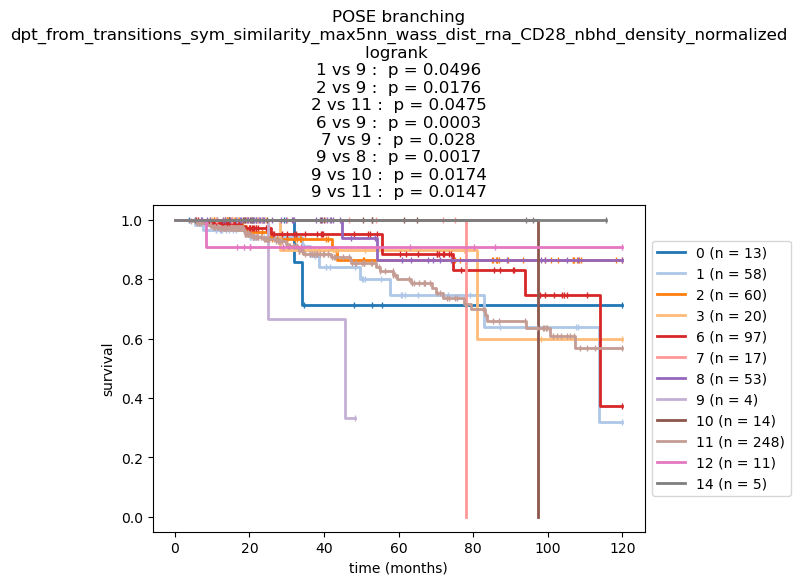

In [49]:
colors = [cm.to_hex(plt.cm.tab10(i)) for i in range(10)] if branch_record.nunique() <=10 else [cm.to_hex(plt.cm.tab20(i)) for i in range(20)]

if branch_record.nunique() <= 20:
    color_cycler = colors
else:
    norm = matplotlib.colors.Normalize(vmin=min(branch_record.unique()), 
                                       vmax=max(branch_record.unique()), clip=True)
    mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.gist_rainbow)
    color_cycler = [mapper.to_rgba(v) for v in sorted(branch_record.unique())]

nfv.KM_between_groups(TEcut['OS_MONTHS'], TEcut['OS_STATUS'], 
                      branch_record, min_group_size=3,
                      figsize=(7, 4), show_censors=True, ci_show=False,
                      show_at_risk_counts=False,
                      ttl=f"POSE branching\n{key}",                      
                      colors=dict(zip(sorted(branch_record.unique()), itertools.cycle(color_cycler))), 
                      xlabel='time (months)', linewidth=2,
                      censor_styles={'ms': 5, 'marker': '|', # 'markeredgecolor': '#ff0000',
                                    },
                      )

### Visualize POSE 

In [44]:
pos = nx.layout.kamada_kawai_layout(G_poser_nn)

First determine features to color nodes by:

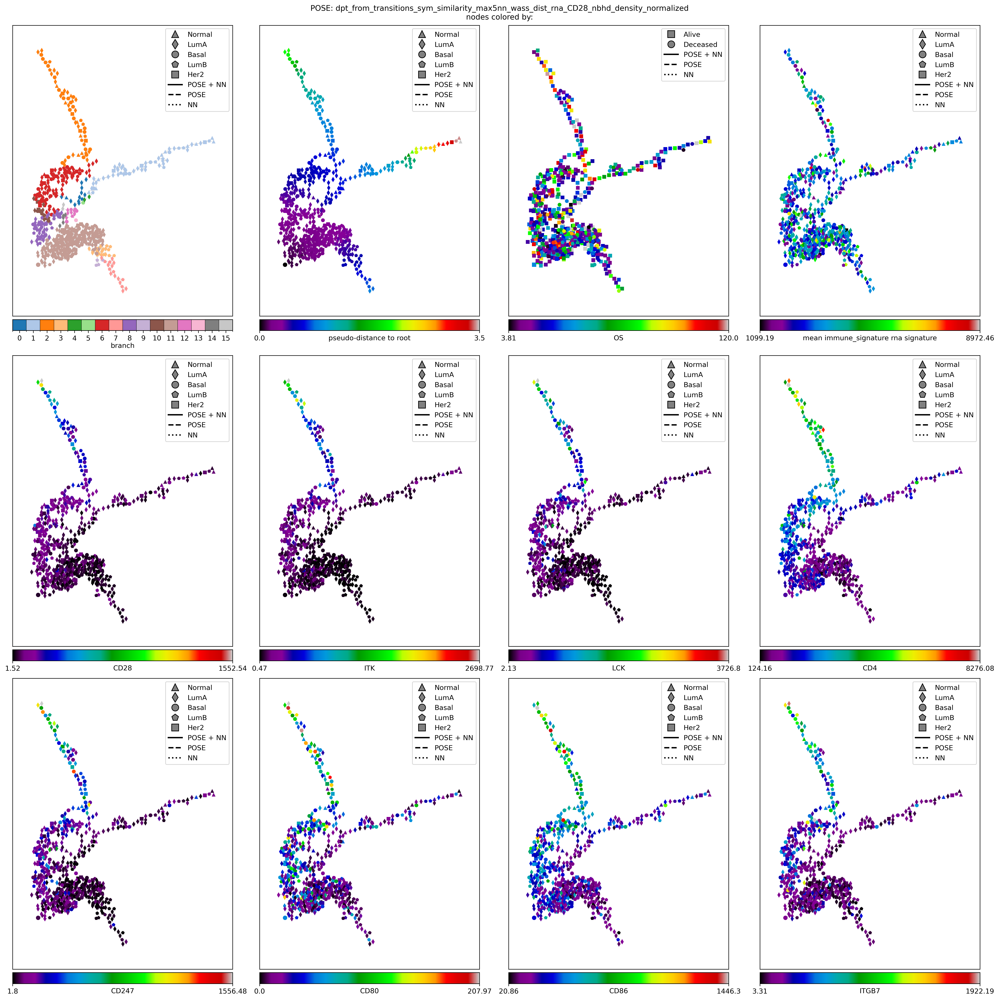

In [51]:
root_obs = poser.root
nodelist = list(G_poser_nn)
edgelist = list(G_poser_nn.edges())
node_labels = {k: G_poser_nn.nodes[k]['name'] for k in nodelist}
edge_style = [G_poser_nn.edges[ee]['edge_origin'] for ee in edgelist]
node_size = [40 if k== root_obs else 30 for k in nodelist]
# node_shape = clin['Dead'].replace({False: 'alive', True: 'deceased'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()
# node_shape_response = clin['Response'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_pam50 = clin['PAM50'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_os = TEcut['OS_STATUS'].replace({1: 'Deceased', 
                                            0: 'Alive'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()

nsm_pam50 = {'Normal': '^', 'LumA': 'd', 'Basal': 'o', 'LumB': 'p', 'Her2': 's'}
nsm_os = {'Alive': 's', 'Deceased': 'o'}

node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
node_colors_record[f'pseudo-distance to root'] = [poser.distances[poser.root, k] for k in nodelist] 
node_colors_record['OS'] = TEcut['OS_MONTHS'].loc[[node_labels[kk] for kk in nodelist]].values.tolist() 
node_colors_record[f"mean {gene_sig_label} rna signature"] = keeper.data['rna'].subset(features=list(set(gene_sig) & set(keeper.graphs['rna']))).mean(axis=0).values.tolist()
# node_colors_record['CD28 rna'] = keeper.data['rna'].subset(features=['CD28']).loc['CD28'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

for gn in ['CD28', 'ITK', 'LCK', 'CD4', 'CD247','CD80','CD86', 'ITGB7']: # ['CD28', 'CD4', 'CCR5', 'CD3G', 'LCP2', 'LCK', 'ITK', 'ITGB7']: # ['CD28', 'GZMB', 'TGFBR2', 'TNF']:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 4, figsize=(20, 20), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);

for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*2 + [node_shape_os] + [node_shape_pam50]*(len(node_colors_record)-3),
                                                           [nsm_pam50]*2 + [nsm_os] + [nsm_pam50]*(len(node_colors_record)-3),
                                                           [True] + [None]*(len(node_colors_record)-1),
                                                           [None]*len(node_colors_record), #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                          )        

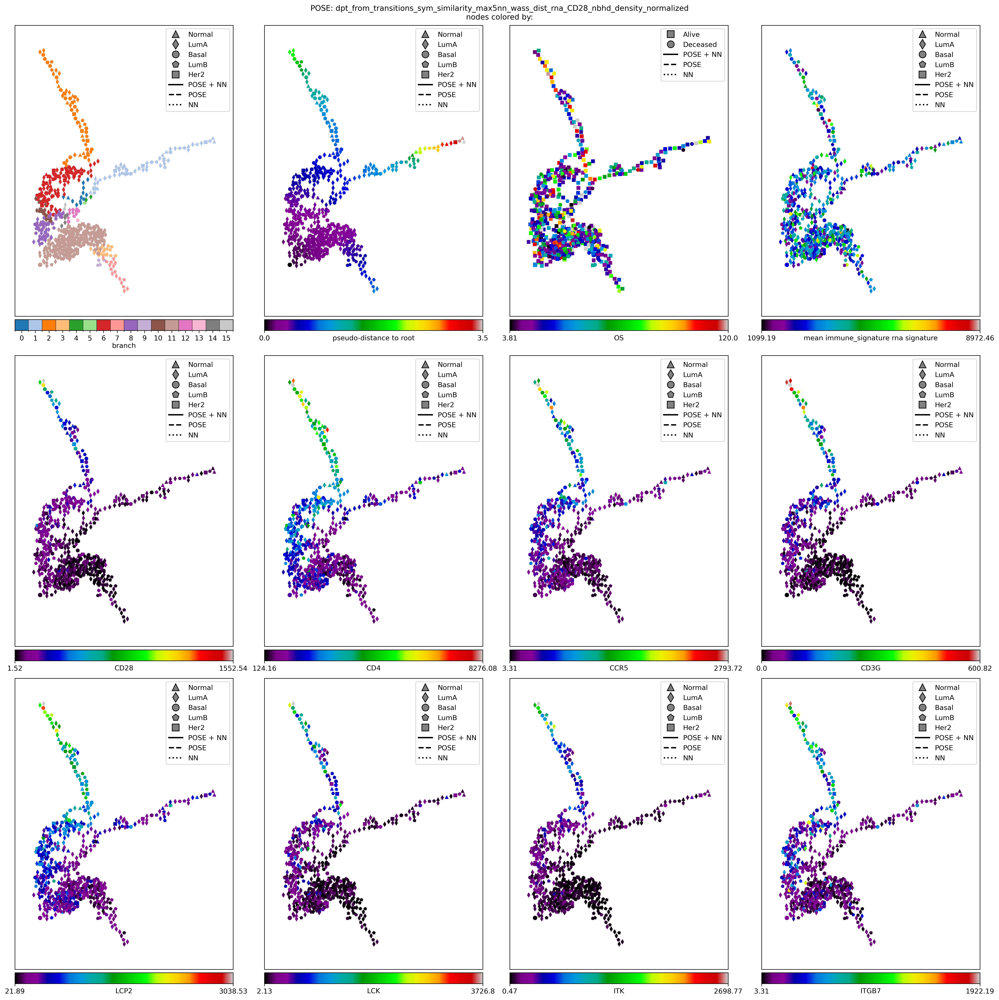

In [52]:
root_obs = poser.root
nodelist = list(G_poser_nn)
edgelist = list(G_poser_nn.edges())
node_labels = {k: G_poser_nn.nodes[k]['name'] for k in nodelist}
edge_style = [G_poser_nn.edges[ee]['edge_origin'] for ee in edgelist]
node_size = [40 if k== root_obs else 30 for k in nodelist]
# node_shape = clin['Dead'].replace({False: 'alive', True: 'deceased'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()
# node_shape_response = clin['Response'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_pam50 = clin['PAM50'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_os = TEcut['OS_STATUS'].replace({1: 'Deceased', 
                                            0: 'Alive'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()

nsm_pam50 = {'Normal': '^', 'LumA': 'd', 'Basal': 'o', 'LumB': 'p', 'Her2': 's'}
nsm_os = {'Alive': 's', 'Deceased': 'o'}

node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
node_colors_record[f'pseudo-distance to root'] = [poser.distances[poser.root, k] for k in nodelist] 
node_colors_record['OS'] = TEcut['OS_MONTHS'].loc[[node_labels[kk] for kk in nodelist]].values.tolist() 
node_colors_record[f"mean {gene_sig_label} rna signature"] = keeper.data['rna'].subset(features=list(set(gene_sig) & set(keeper.graphs['rna']))).mean(axis=0).values.tolist()
# node_colors_record['CD28 rna'] = keeper.data['rna'].subset(features=['CD28']).loc['CD28'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

for gn in ['CD28', 'CD4', 'CCR5', 'CD3G', 'LCP2', 'LCK', 'ITK', 'ITGB7']: # ['CD28', 'GZMB', 'TGFBR2', 'TNF']: 
    # ['CD28', 'ITK', 'LCK', 'CD4', 'CD247','CD80','CD86']
    
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 4, figsize=(20, 20), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);

for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*2 + [node_shape_os] + [node_shape_pam50]*(len(node_colors_record)-3),
                                                           [nsm_pam50]*2 + [nsm_os] + [nsm_pam50]*(len(node_colors_record)-3),
                                                           [True] + [None]*(len(node_colors_record)-1),
                                                           [None]*len(node_colors_record), #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                          )        

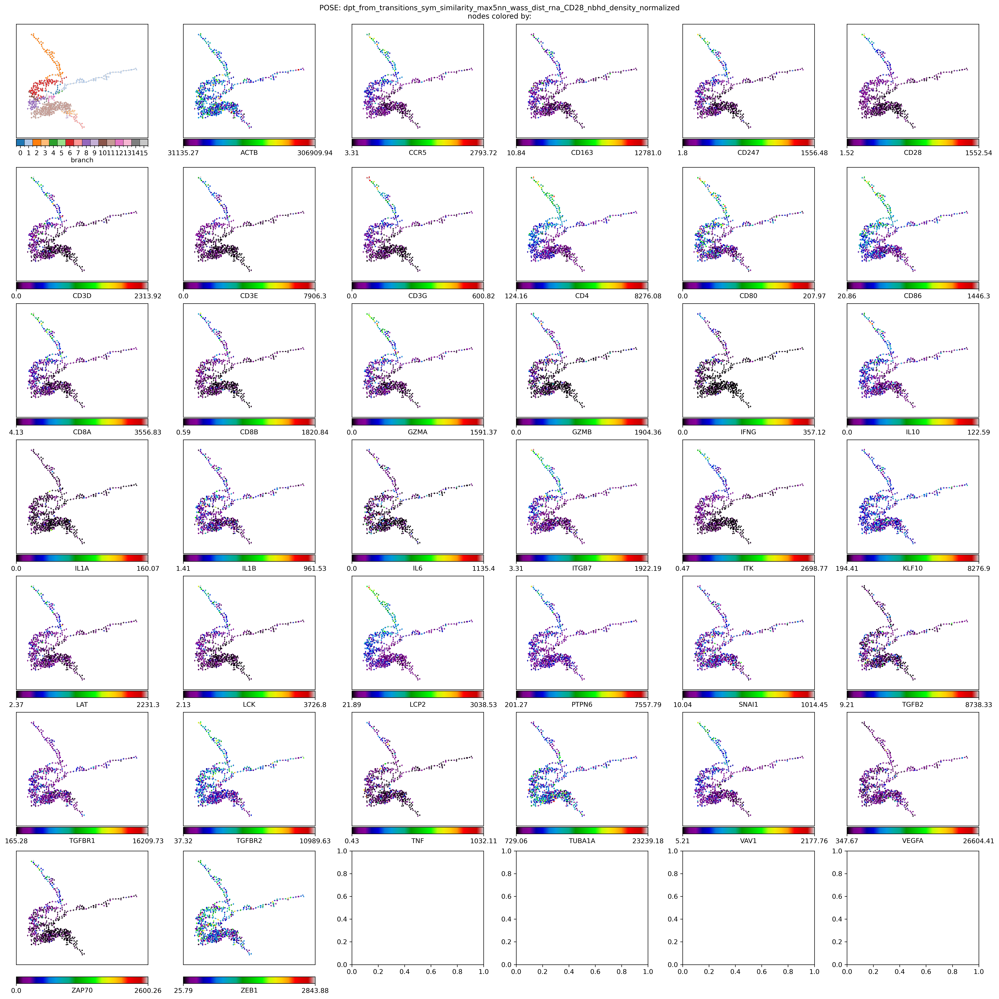

In [53]:
node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
for gn in gene_sig:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(7,6, figsize=(21,21), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);
node_size=5
for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*len(node_colors_record), # 2 + [node_shape_os] + [node_shape_pam50]*6,
                                                           [nsm_pam50]*len(node_colors_record), # *2 + [nsm_os] + [nsm_pam50]*6,
                                                           [True] + [None]*len(node_colors_record), # *8,
                                                           [None]*len(node_colors_record), # *8, #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                           edge_show_legend=False, node_show_legend=False,
                          )

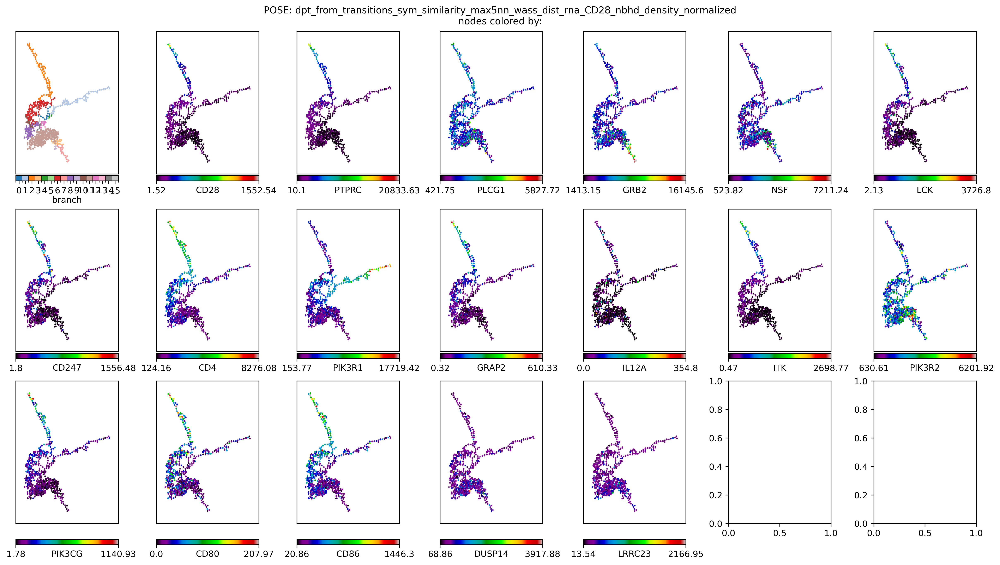

In [54]:
node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
for gn in ['CD28'] + list(keeper.graphs['rna'].neighbors('CD28')): # gene_sig:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 7, figsize=(16,9), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);
node_size=5
for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*len(node_colors_record), # 2 + [node_shape_os] + [node_shape_pam50]*6,
                                                           [nsm_pam50]*len(node_colors_record), # *2 + [nsm_os] + [nsm_pam50]*6,
                                                           [True] + [None]*len(node_colors_record), # *8,
                                                           [None]*len(node_colors_record), # *8, #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                           edge_show_legend=False, node_show_legend=False,
                          )